# Style Transfert

#### The paper implemented : https://arxiv.org/pdf/1508.06576.pdf

In [1]:
from keras.applications import vgg16
from keras.layers import Input, Concatenate
from keras.models import Model, Sequential
from keras import backend as K
import tensorflow as tf

Using TensorFlow backend.


In [19]:
import matplotlib.pyplot as plt
%matplotlib inline

### Model

In [2]:
K.clear_session()
content_input = Input(batch_shape=(1, 224, 224, 3))
style_input = Input(batch_shape=(1, 224, 224, 3))
output_tensor = tf.get_variable("output_tensor", [1, 224, 224, 3])
output_input = Input(tensor=output_tensor)
alltens = [content_input,style_input,output_input]
input_tensor = tf.concat(alltens,axis=0)

vgg_model = vgg16.VGG16(input_tensor=input_tensor, weights='imagenet', include_top=False) # We create a pretrained VGG 16 model, include_top=False ensures we don't use the fully connected layers.

In [3]:
vgg_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         (None, None, None, 3)     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0         
__________

### Selection of layers for content information and style information

Layers closer to the input this will use more simplistic features, while layers closer to the end will use more complicated features. The content and style loss weights effect how stylized vs similar to the content image the output will look.

"[...] each layer in the network deﬁnes a non-linear ﬁlter bank whose complexity increases with the position of the layer in the network"

In [4]:
content_layer = 'block4_conv2'   #the layer block4_conv2 is used for content information
style_layers = ['block1_conv1','block2_conv1','block3_conv1','block4_conv1','block5_conv1'] #we use 5 layers as style information
    
content_loss_weight = .05
style_loss_weight = 7.5

In [5]:
layers_dict = dict([(layer.name, layer.output) for layer in vgg_model.layers])

### Loss Functions

#### Feature reconstruction loss
We define a feature reconstruction loss based on our content features and our output feature: $$\frac{1}{2} \sum_{i,j, k} (F_{ijk} - P_{ijk})^2$$ where $F$ is the 3D tensor of content features and $P$ is the 3D tensor of our output image features. 

In [6]:
def feature_reconstruction_loss(content_img_features, output_img_features):
    return .5*tf.reduce_sum(tf.squared_difference(content_img_features,output_img_features))

#### Style loss

###### Gram Matrix:

$$ G_{ij} = \sum_{k} (F_{ik} F_{kj}) $$



We take our features and represent them as a Gram Matrix. Then we implement the loss function:
$$ \frac{1}{4H^2W^2C^2} \sum_{ij} (G_{ij} - A_{ij})^2 $$ where $G$ is the Gram matrix of the output image features and $A$ is the Gram Matrix of the style image features. 

In [8]:
def gram_matrix(x):
    # make channels first dimension
    x = tf.transpose(x, (2, 0, 1))
    # flatten everything but channels so x is now (C, H*W)
    x = tf.reshape(x, tf.stack([-1, tf.reduce_prod(tf.shape(x)[1:])]))
    return tf.matmul(x, tf.transpose(x))

In [9]:
def style_loss(style_img_features, output_img_features, img_shape):
    """Takes a tensor representing a layer of VGG features from the style image and a tensor
    representing a layer of VGG features from the current output image and returns 
    the style loss for these features.
    """
    
    constants = 4*(img_shape[0]*img_shape[1]*img_shape[2])**2
    
    gram_G = gram_matrix(output_img_features)
    gram_A = gram_matrix(style_img_features)
                         
    return tf.reduce_sum(tf.squared_difference(gram_G,gram_A))/constants

In [10]:
content_features = layers_dict[content_layer]

content_img_features = content_features[0, :, :, :] 
output_content_features = content_features[2, :, :, :]

content_loss = feature_reconstruction_loss(content_img_features, output_content_features)

In [11]:
total_style_loss = tf.zeros(1)
weight = 1.0 / len(style_layers)

for style_layer in style_layers:
    
    style_features = layers_dict[style_layer]
    style_img_features = style_features[1, :, :, :]
    output_img_features = style_features[2, :, :, :]
    
    
    total_style_loss += weight * style_loss(style_img_features, output_img_features, (224, 224, 3))
    
    
total_style_loss

<tf.Tensor 'add_4:0' shape=(1,) dtype=float32>

Now we need to combine our two loss functions using the weightings we defined earlier. 

In [12]:
total_loss = style_loss_weight*total_style_loss + content_loss_weight*content_loss 
total_loss

<tf.Tensor 'add_5:0' shape=(1,) dtype=float32>

In [13]:
optimize = tf.train.AdamOptimizer(learning_rate=10).minimize(total_loss, var_list=[output_tensor])
optimize

<tf.Operation 'Adam' type=NoOp>

# Part 2: Feeding in Images

We now want to load and preprocess our images. Keras provides a `load_img` function that conviently loads our image and then cuts it down to our target size. Keras also provides a `vgg16.preprocess_input` that preprocesses images to be in the format vgg16 expects. 

In [14]:
from keras.preprocessing.image import load_img, img_to_array
import numpy as np

def load_image(img_path):
    img = load_img(img_path,target_size=(224,224,3))
    img = img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = vgg16.preprocess_input(img)
    return img

def deprocess_image(x):
    x = x.reshape((224, 224, 3))
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    # 'BGR'->'RGB'
    x = x[:, :, ::-1]
    x = np.clip(x, 0, 255).astype('uint8')
    return x

def darken_image(x):
    x = x.reshape((224, 224, 3))
    x[:, :, 0] -= 103.939
    x[:, :, 1] -= 116.779
    x[:, :, 2] -= 123.68
    # 'BGR'->'RGB'
    x = x[:, :, ::-1]
    x = np.clip(x, 0, 255).astype('uint8')
    return x

In [15]:
import os
os.listdir('images')

['banksy.jpg', 'Croatia_jump.jpg']

### Here comes the fun part

Let's now get some image and try to play with it

In [55]:
jump_img = 'images/Croatia_jump.jpg'
banksy_img = 'images/banksy.jpg'

turtle_img = 'images/turtle_hawaii.jpg'
monroe1_img = 'images/monroe.jpg'
monroe2_img = 'images/monroe2.jpg'

wave_img = 'images/waaaave.jpg'
sunset_img = 'images/sunset.jpg'

content_img_path = wave_img
style_img_path = sunset_img

We define which image will be used for content and which one will be used for the style:

In [56]:
content_img = load_image(content_img_path)
style_img = load_image(style_img_path)

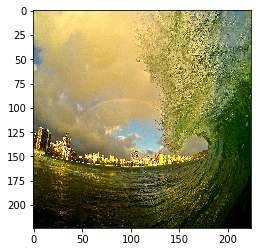

In [57]:
plt.imshow(deprocess_image(content_img))

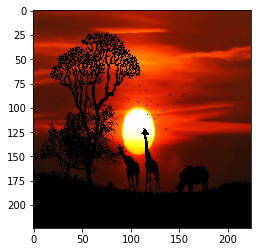

In [58]:
plt.imshow(deprocess_image(style_img))

In [59]:
assign_var = tf.assign(output_tensor, content_img)
sess = K.get_session()
var = sess.run(assign_var)

In [60]:
import time

Running iteration: 0
13.377498149871826
[2.5262839e+11]
Running iteration: 1
11.288599491119385
[2.1248179e+11]
Running iteration: 2
11.451956510543823
[1.6994558e+11]
Running iteration: 3
10.3469557762146
[1.3660609e+11]
Running iteration: 4
10.395204782485962
[1.1049985e+11]
Running iteration: 5
10.32140064239502
[8.998298e+10]
Running iteration: 6
10.285080909729004
[7.528946e+10]
Running iteration: 7
10.2994225025177
[6.6974523e+10]
Running iteration: 8
10.217734575271606
[6.4935887e+10]
Running iteration: 9
10.245405673980713
[6.573947e+10]
Running iteration: 10
10.234089612960815
[6.403818e+10]
Running iteration: 11
10.294275522232056
[5.8198385e+10]
Running iteration: 12
10.31876540184021
[5.0728907e+10]
Running iteration: 13
10.199112176895142
[4.4482605e+10]
Running iteration: 14
10.291608333587646
[4.0466153e+10]
Running iteration: 15
10.181628704071045
[3.801212e+10]
Running iteration: 16
10.35304045677185
[3.6199903e+10]
Running iteration: 17
10.235932350158691
[3.4507874e+

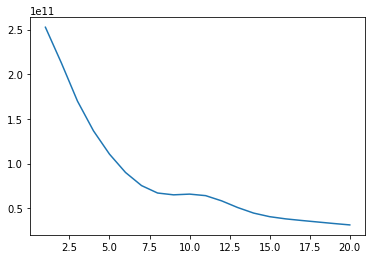

In [61]:
n_iterations = 20

iteration = np.arange(1,n_iterations+1)
loss_vals = []

for i in range(n_iterations):
    
    
    print("Running iteration: {}".format(i))
    time1 = time.time()
    _, output_val, loss = sess.run([optimize, output_tensor, total_loss], feed_dict={content_input: content_img, style_input: style_img})
    time2 = time.time()
    print(time2-time1)
    print(loss)
    loss_vals += [loss]
    
print('Done')
loss_vals = np.array(loss_vals)
plt.plot(iteration,loss_vals)

In [62]:
output_img = deprocess_image(output_val) 

In [63]:
output_img = darken_image(output_val)

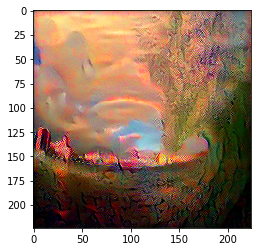

In [64]:
plt.imshow(output_img)

# Summary

Style transfer is an extension of a vast CNN, VGG16, which is used for image classification. It works by taking an input photo for both content and style, running them each through the CNN, then comparing their outputs at various layers. The outputs from these layers can be thought of as filtered versions of the input photo, which are powerful because they pick out main distinguishing features of the photo. By using these filters to extract some concept of a style, then filtering for the main content of another given photo, a loss can be constructed using weights of one's choosing to turn creating a new piece of art into an optimization problem. The solution to this optimization problem is a photo that fits the right amount of style and content based upon the given weights. We iteratively alter a photo using gradient descent to numerically minimize the loss function, and thus produce a better photo with each loop.

# Some fun stuffs

### First try

##### Input: a nice jump shot I took when I traveled in Croatia

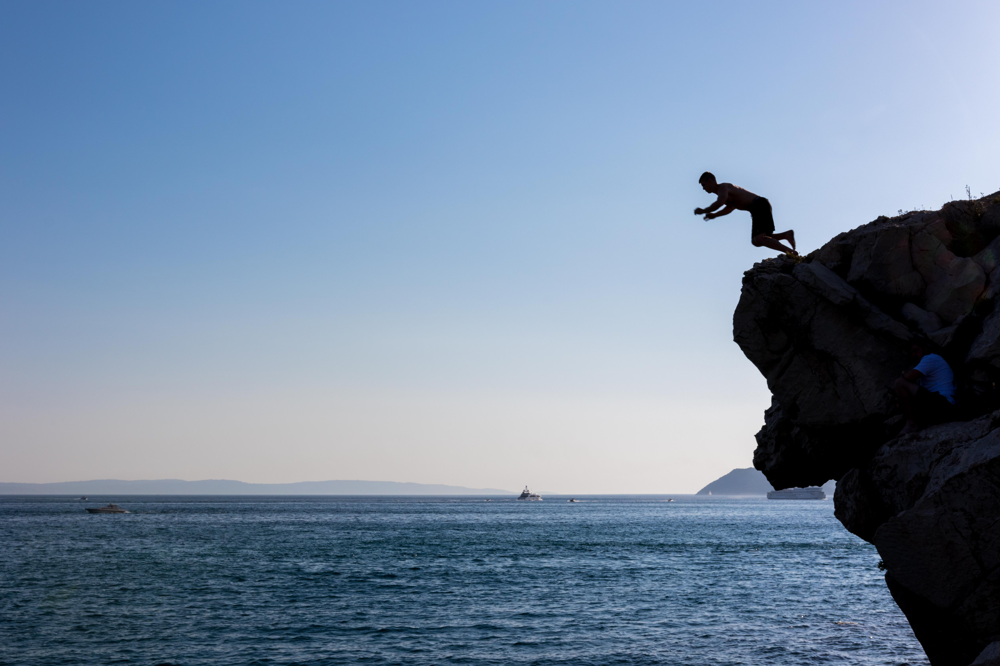

In [66]:
from IPython.display import Image
Image(filename='images/Croatia_jump.jpg') 

##### Style: this Banksy piece of art

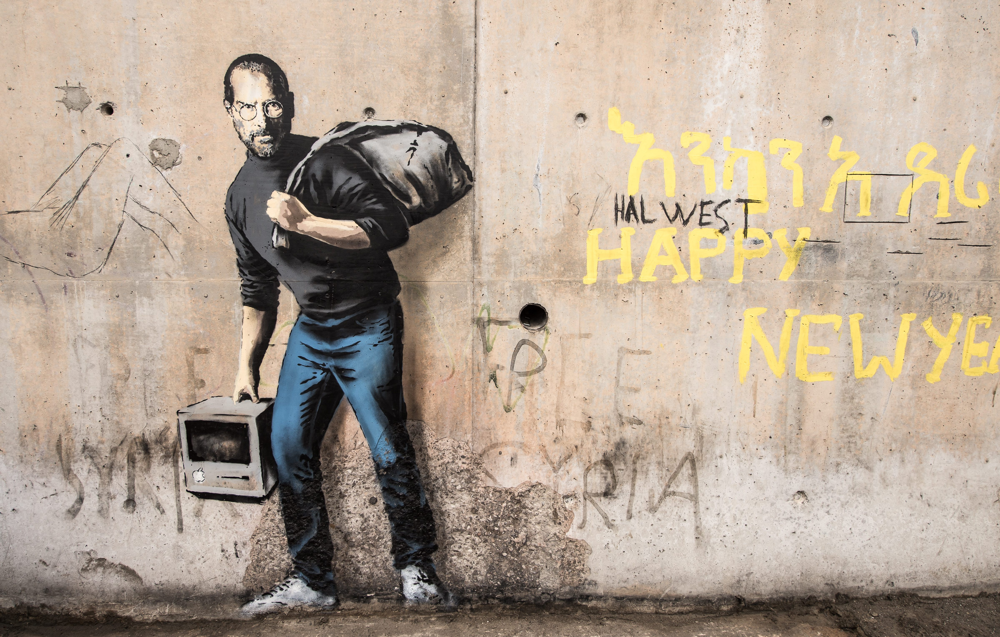

In [67]:
Image(filename='images/banksy.jpg') 

##### Settings:

Content layer: Block 4, Conv 2

Style layers: Block 3, Conv 1
              Block 5, Conv 1

Weights: Content = .05, Style = 7.5

Additional: Darkened

##### Output

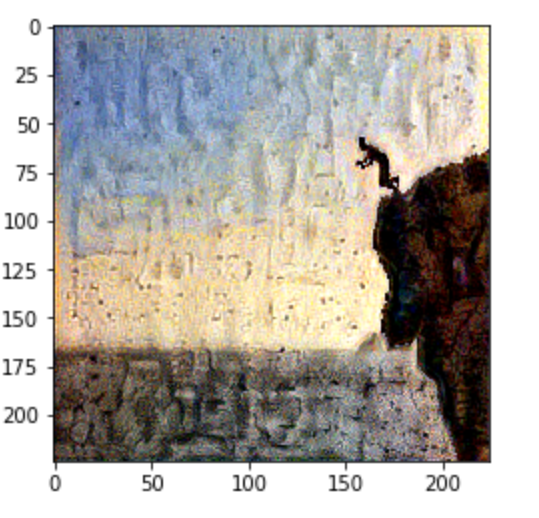

In [70]:
Image(filename='images/Result1.png') 

## 2rd shot, let's get creative !

##### Input: an awesome turtle from Hawaii 

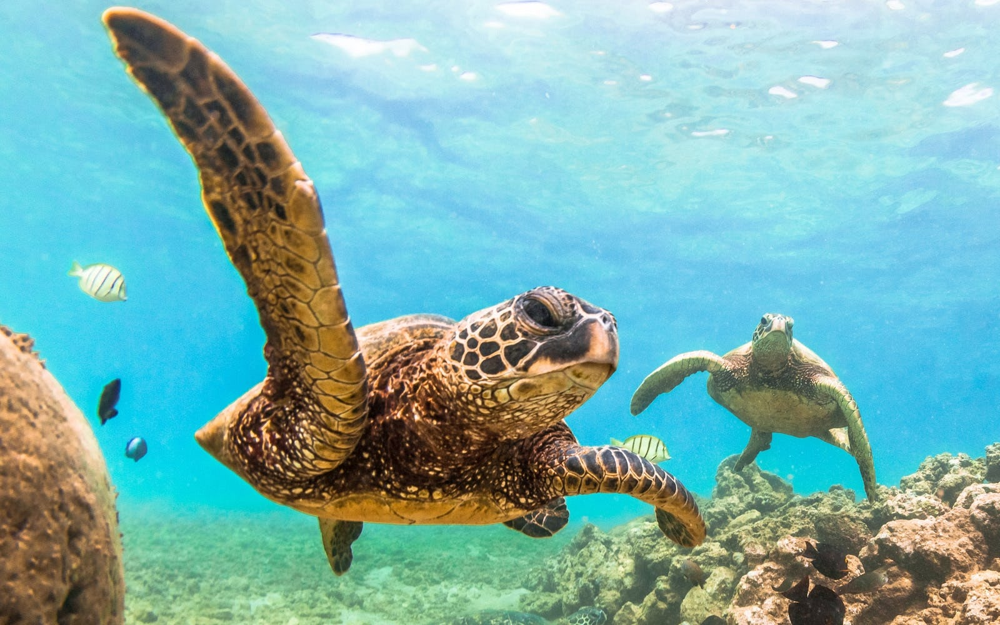

In [71]:
Image(filename='images/turtle_hawaii.jpg') 

##### Style: A nice Marylin Monroe piece of art

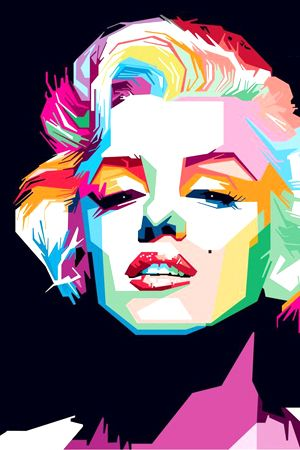

In [72]:
Image(filename='images/monroe.jpg') 

##### Settings:

Content layer: Block 4, Conv 2

Style layers: Block 3, Conv 1
              Block 5, Conv 1

Weights: Content = .05, Style = 7.5

Additional: Darkened

##### Output

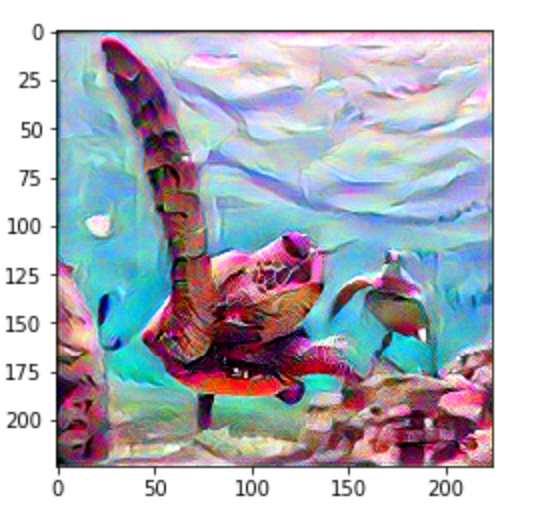

In [75]:
Image(filename='images/Result2_monroe1.png') 

##### This is sooo nice guyzz

## Last one, come on.. how would a nice wave be with an awesooome sunset?

###### Input: This Hawaiian waves qui régale

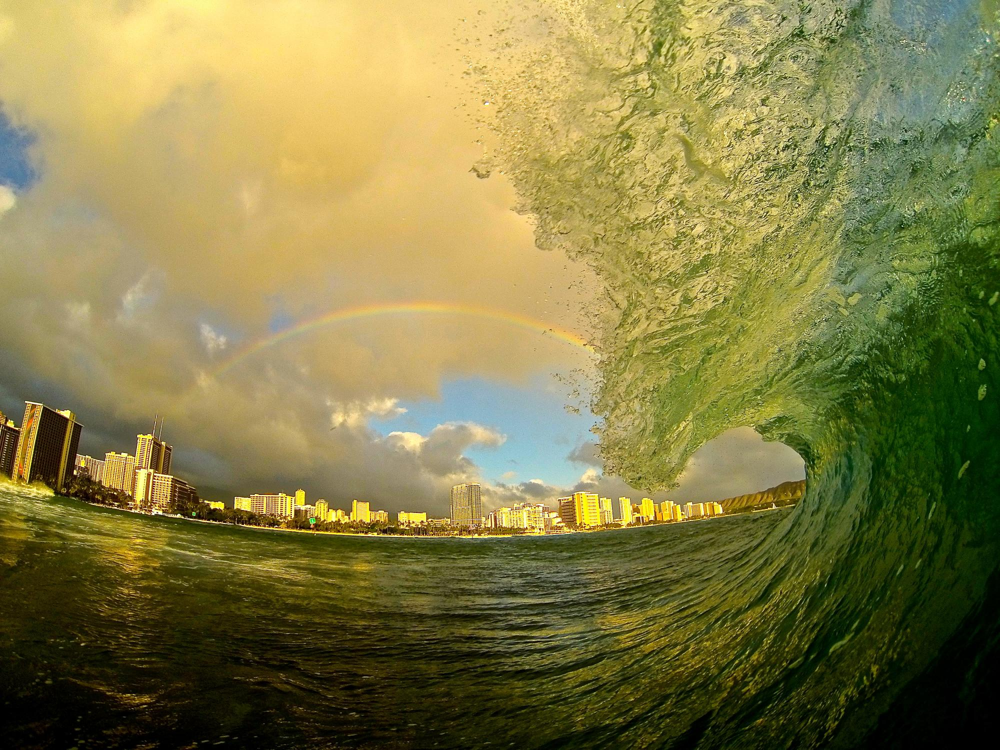

In [76]:
Image(filename='images/waaaave.jpg') 

Yet the style of this image is not perfect, let's improve this !

##### Style: a great sunset picture

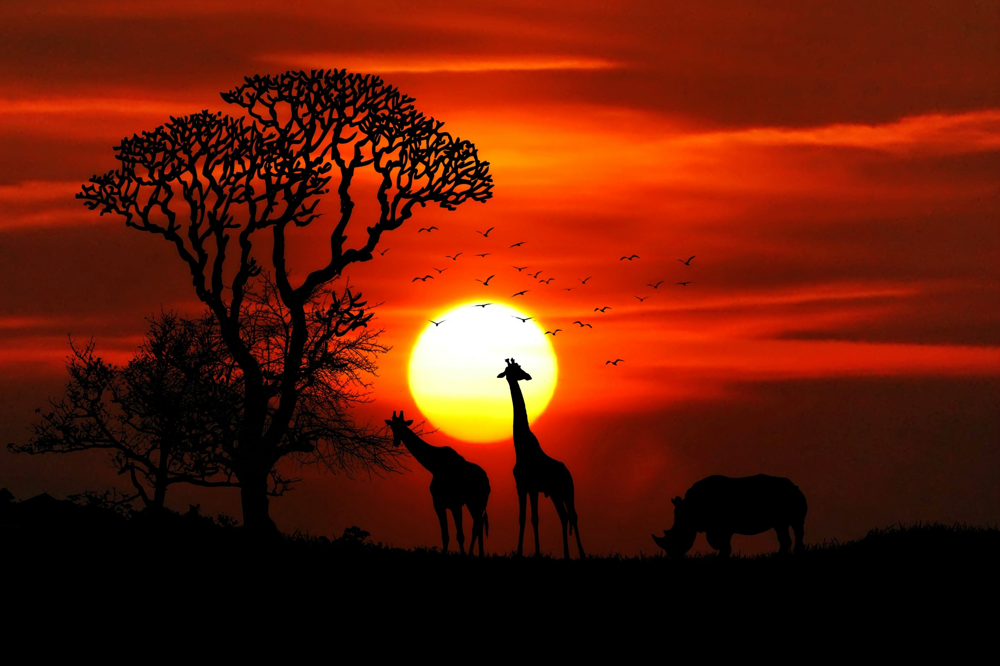

In [77]:
Image(filename='images/sunset.jpg') 

##### Settings:

Content layer: Block 4, Conv 2

Style layers: Block 3, Conv 1
              Block 5, Conv 1

Weights: Content = .05, Style = 7.5

Additional: Darkened

##### Output

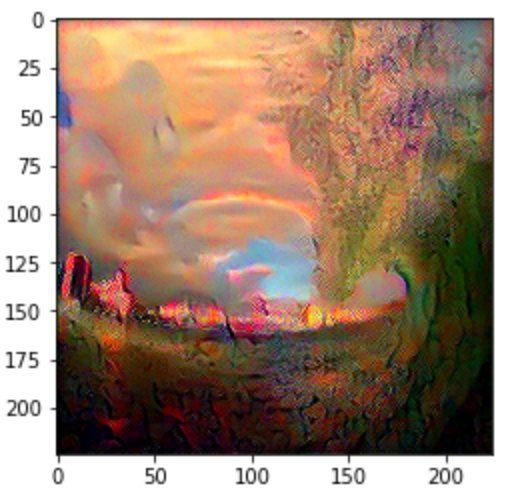

In [79]:
Image(filename='images/Result4.png') 

## Last words

This is awesome ! Now the next steps are to play a bit more with parameters settings and definetely to improve the output image qualities. 